# PR-0017
### Telecom – Churn Rate ML
#### Team Members: Prabhati Acharya and Vivek Viswanathan

## Business Goal

No-Churn Telecom is an established Telecom operator in Europe with more than a decade in Business. Due to new players in the
market, telecom industry has become very competitive and retaining customers becoming a challenge.

In spite of No-Churn initiatives of reducing tariffs and promoting more offers, the churn rate ( percentage of customers migrating to competitors) is well above 10%.

No-Churn wants to explore possibility of Machine Learning to help with following use cases to retain competitive edge in the industry. 

### Project Goal

Help No-Churn with their use cases with ML
1. Understanding the variables that are influencing the customers to migrate.
2. Creating Churn risk scores that can be indicative to drive retention campaigns.
3. Introduce new predicting variable “CHURN-FLAG” with values YES(1) or NO(0) so that email campaigns with lucrative offers can be targeted to Churn YES customers.
4. Exporting the trained model with prediction capability for CHURN-FLAG, which can be highlighted in service applications to serve the customer better.

##### Import the necessary packages

In [1]:
import pymysql
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from time import time
from collections import Counter
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, OneHotEncoder
from pandas_profiling import ProfileReport
from IPython.display import Image
from sklearn.model_selection import train_test_split, RandomizedSearchCV, KFold, cross_val_score, GridSearchCV
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, RandomForestRegressor, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, StackingClassifier
from sklearn.tree import export_graphviz
import pydotplus
from sklearn import tree
from sklearn.externals.six import StringIO
import graphviz
import matplotlib.image as mpimg
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, classification_report, roc_curve, roc_auc_score

from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
import itertools
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.feature_selection import RFECV
from vecstack import stacking
from mlxtend.classifier import StackingCVClassifier
from mlxtend.plotting import plot_learning_curves, plot_decision_regions
#from sklearn.pipeline import Pipeline
#from sklearn.neighbors import NearestNeighbors
from sklearn.calibration import CalibratedClassifierCV



import warnings
warnings.simplefilter('ignore')

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\externals\six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [2]:
rand_state = 10
n_iterations = 5

In [3]:
db_host='54.255.64.49'
username='dm_team3'
user_pass='DM!$!Team!27@9!20&'
db_name='project_telecom'

In [4]:
conn = pymysql.connect(host=db_host,port=int(3306),user=username,passwd=user_pass,db=db_name)

In [5]:
telecom_churn_data=pd.read_sql_query("SELECT * FROM telecom_churn_data ",conn)
telecom_churn_data.head()

,columns1,columns2,columns3,columns4,columns5,columns6,columns7,columns8,columns9,columns10,...,columns12,columns13,columns14,columns15,columns16,columns17,columns18,columns19,columns20,columns21
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


#### Set the column names based on the information provided in the requirements document

In [6]:
telecom_churn_data.columns = ['State', 'Account_Length', 'Area_Code','Phone', 'Int_Plan', 'VMail', 'VMailMsg', 'DayMins', 'DayCalls', 'DayCharge', 'EveMins', 'EveCalls', 'EveCharge', 'NightMins', 'NightCalls', 'NightCharge', 'IntMins', 'IntCalls', 'IntCharge', 'CustServCalls', 'Churn']

### EDA of the dataset

Perform the following exploratory data analysis on the dataset
- Shape of the dataset
- Info to get column names, number of not null count and data type
- Null Count
- Count of distinct values for each column
- The distinct values and the counts for the categorical variables

In [7]:
telecom_churn_data.shape

(4617, 21)

In [8]:
telecom_churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   State           4617 non-null   object
 1   Account_Length  4617 non-null   object
 2   Area_Code       4617 non-null   object
 3   Phone           4617 non-null   object
 4   Int_Plan        4617 non-null   object
 5   VMail           4617 non-null   object
 6   VMailMsg        4617 non-null   object
 7   DayMins         4617 non-null   object
 8   DayCalls        4617 non-null   object
 9   DayCharge       4617 non-null   object
 10  EveMins         4617 non-null   object
 11  EveCalls        4617 non-null   object
 12  EveCharge       4617 non-null   object
 13  NightMins       4617 non-null   object
 14  NightCalls      4617 non-null   object
 15  NightCharge     4617 non-null   object
 16  IntMins         4617 non-null   object
 17  IntCalls        4617 non-null   object
 18  IntCharg

In [9]:
telecom_churn_data.isnull().sum()

State             0
Account_Length    0
Area_Code         0
Phone             0
Int_Plan          0
VMail             0
VMailMsg          0
DayMins           0
DayCalls          0
DayCharge         0
EveMins           0
EveCalls          0
EveCharge         0
NightMins         0
NightCalls        0
NightCharge       0
IntMins           0
IntCalls          0
IntCharge         0
CustServCalls     0
Churn             0
dtype: int64

In [10]:
telecom_churn_data.nunique(dropna=False)

State               51
Account_Length     218
Area_Code            3
Phone             4617
Int_Plan             2
VMail                2
VMailMsg            47
DayMins           1901
DayCalls           123
DayCharge         1901
EveMins           1833
EveCalls           125
EveCharge         1621
NightMins         1813
NightCalls         130
NightCharge       1012
IntMins            168
IntCalls            21
IntCharge          168
CustServCalls       10
Churn                2
dtype: int64

In [12]:
Catvar_list=['State', 'Area_Code', 'Int_Plan', 'VMail', 'IntCalls', 'CustServCalls', 'Churn']

In [13]:
telecom_churn_data[Catvar_list]

,State,Area_Code,Int_Plan,VMail,IntCalls,CustServCalls,Churn
0,KS,415,no,yes,3,1,False.
1,OH,415,no,yes,3,1,False.
2,NJ,415,no,no,5,0,False.
3,OH,408,yes,no,7,2,False.
4,OK,415,yes,no,3,3,False.
...,...,...,...,...,...,...,...
4612,NY,510,no,yes,6,3,False.
4613,NM,408,no,yes,1,3,False.
4614,VT,408,no,yes,3,1,False.
4615,MI,415,no,yes,3,0,False.


In [14]:
for cat in Catvar_list:
    print('\nUnique values of Project_Data.'+cat+':: \n',telecom_churn_data[cat].value_counts(dropna = False))


Unique values of Project_Data.State:: 
 WV    149
AL    114
MN    112
ID    110
OH    110
VA    109
NY    109
OR    107
WY    106
NJ    106
TX    105
UT    104
WI     99
MI     98
MA     97
KS     96
VT     95
ME     95
CT     92
MD     92
MT     92
NH     91
MS     91
CO     91
KY     90
RI     90
DE     89
IN     89
WA     89
NV     89
FL     85
MO     84
NM     84
SC     83
TN     83
NC     83
DC     82
AZ     81
ND     80
OK     80
HI     79
NE     79
IL     79
GA     77
AR     77
SD     76
LA     73
AK     69
PA     68
IA     65
CA     44
Name: State, dtype: int64

Unique values of Project_Data.Area_Code:: 
 415    2299
408    1161
510    1157
Name: Area_Code, dtype: int64

Unique values of Project_Data.Int_Plan:: 
  no     4171
 yes     446
Name: Int_Plan, dtype: int64

Unique values of Project_Data.VMail:: 
  no     3381
 yes    1236
Name: VMail, dtype: int64

Unique values of Project_Data.IntCalls:: 
 3     925
4     881
2     680
5     646
6     460
7     283
1     245
8     

#### Drop the unique column (Phone Number) from the data set as it adds no value to the analysis.

In [11]:
telecom_churn_data.drop(columns='Phone', inplace=True)

###### Profiling the dataset

Generates profile reports from a pandas DataFrame. The pandas df.describe() function is great but a little basic for serious exploratory data analysis. pandas_profiling extends the pandas DataFrame with df.profile_report() for quick data analysis.

For each column the following statistics - if relevant for the column type - are presented in an interactive HTML report:

- Type inference: detect the types of columns in a dataframe.
- Essentials: type, unique values, missing values
- Quantile statistics like minimum value, Q1, median, Q3, maximum, range, interquartile range
- Descriptive statistics like mean, mode, standard deviation, sum, median absolute deviation, coefficient of variation, kurtosis, skewness
- Most frequent values
- Histograms
- Correlations highlighting of highly correlated variables, Spearman, Pearson and Kendall matrices
- Missing values matrix, count, heatmap and dendrogram of missing values
- Duplicate rows Lists the most occurring duplicate rows
- Text analysis learn about categories (Uppercase, Space), scripts (Latin, Cyrillic) and blocks (ASCII) of text data

In [15]:
ProfileReport(telecom_churn_data)

### Encoding Categorical Variables

We will proceed to encode all the variables with __object__ data type. We will also store all the mapping between the Feature values and the corresponding encoded values in a dataframe so that we can refer back to it in order to explain the interactions between the features.

In [16]:
Catvar_list_enc=['State', 'Area_Code', 'Int_Plan', 'VMail', 'Churn']

In [17]:
labelencoder = LabelEncoder()

In [18]:
telecom_churn_data_enc = telecom_churn_data

In [19]:
Feature_Code_Value = pd.DataFrame(columns=['Feature_Type', 'Feature_Value', 'Feature_Value_Enc', 'Feature_Value_Cnt'])

In [20]:
for feat in Catvar_list_enc:
    feat_col_name = feat+'_enc'
    telecom_churn_data_enc[feat_col_name] = labelencoder.fit_transform(telecom_churn_data_enc[feat].astype(str))
    feat_temp_val = telecom_churn_data_enc.groupby([feat, feat_col_name]).size().reset_index().rename(columns={0:'Feature_Value_Cnt'})
    feat_temp_val['Feature_Type'] = feat
    #feat_temp_val[['Feature_Type', feat, feat_col_name, 'Feature_Value_Cnt']]
    Feature_Code_Value = Feature_Code_Value[['Feature_Type', 'Feature_Value', 'Feature_Value_Enc', 'Feature_Value_Cnt']].append(feat_temp_val[['Feature_Type', feat, feat_col_name, 'Feature_Value_Cnt']])
    Feature_Code_Value.Feature_Value.fillna(Feature_Code_Value[feat], inplace=True)
    Feature_Code_Value.Feature_Value_Enc.fillna(Feature_Code_Value[feat_col_name], inplace=True)
    Feature_Code_Value.drop(columns=[feat, feat_col_name], axis=1, inplace=True)
    del feat_temp_val
    telecom_churn_data_enc.drop(columns=[feat], axis=1, inplace=True)
    
Feature_Code_Value.reset_index(drop=True, inplace=True)
Feature_Code_Value['Feature_Value_Enc'] = Feature_Code_Value['Feature_Value_Enc'].astype(int)

In [21]:
Feature_Code_Value

,Feature_Type,Feature_Value,Feature_Value_Enc,Feature_Value_Cnt
0,State,AK,0,69
1,State,AL,1,114
2,State,AR,2,77
3,State,AZ,3,81
4,State,CA,4,44
5,State,CO,5,91
6,State,CT,6,92
7,State,DC,7,82
8,State,DE,8,89
9,State,FL,9,85


### Distribution of the features

We next check the distribution of the categorical and continous variables. 

In [22]:
Catvar_list=['State_enc', 'Area_Code_enc', 'Int_Plan_enc', 'VMail_enc', 'IntCalls', 'CustServCalls', 'Churn_enc']

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000026971419F98>,
      dtype=object)

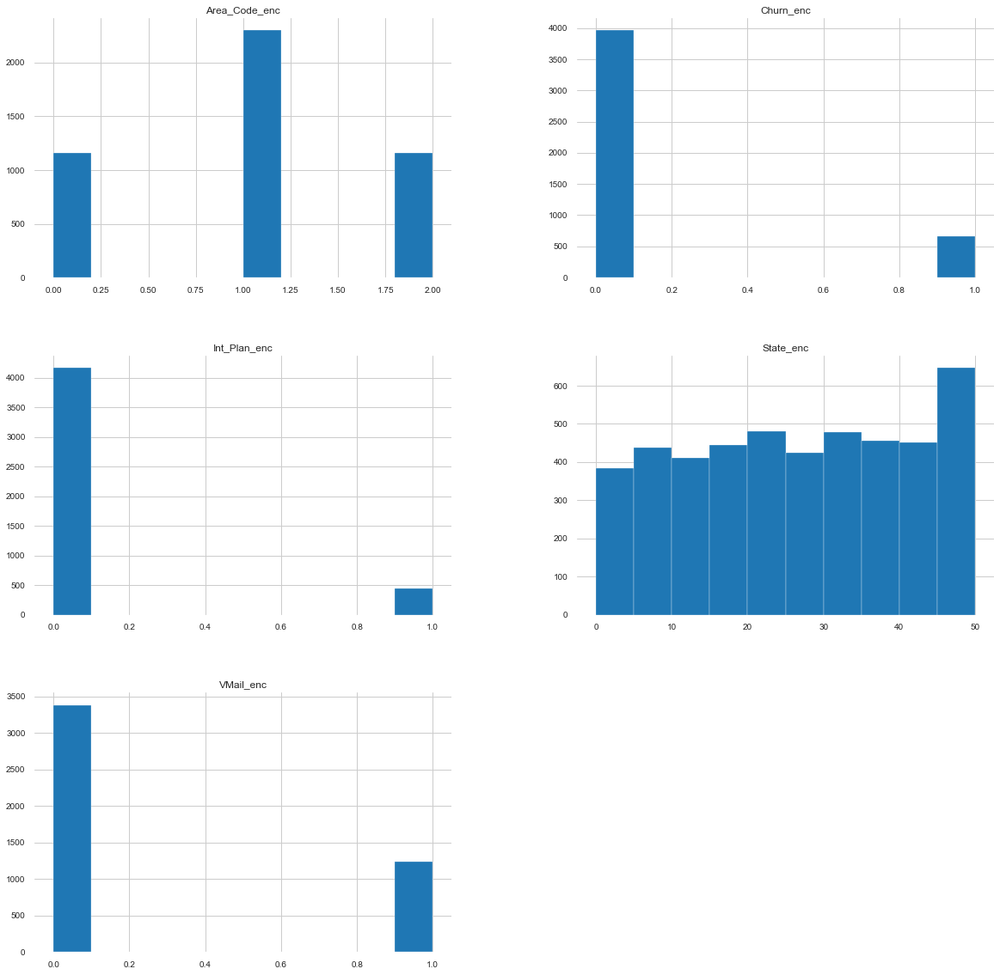

In [23]:
telecom_churn_data_enc[Catvar_list].hist(figsize=(20,20))

In [24]:
Convar_list=['Account_Length','VMailMsg','DayMins','DayCalls','DayCharge','EveMins','EveCalls','EveCharge','NightMins',
            'NightCalls','NightCharge','IntMins','IntCharge']

In [25]:
for i in Convar_list:
    telecom_churn_data_enc[i]=telecom_churn_data_enc[i].astype('float').astype(int)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000269030555F8>,
      dtype=object)

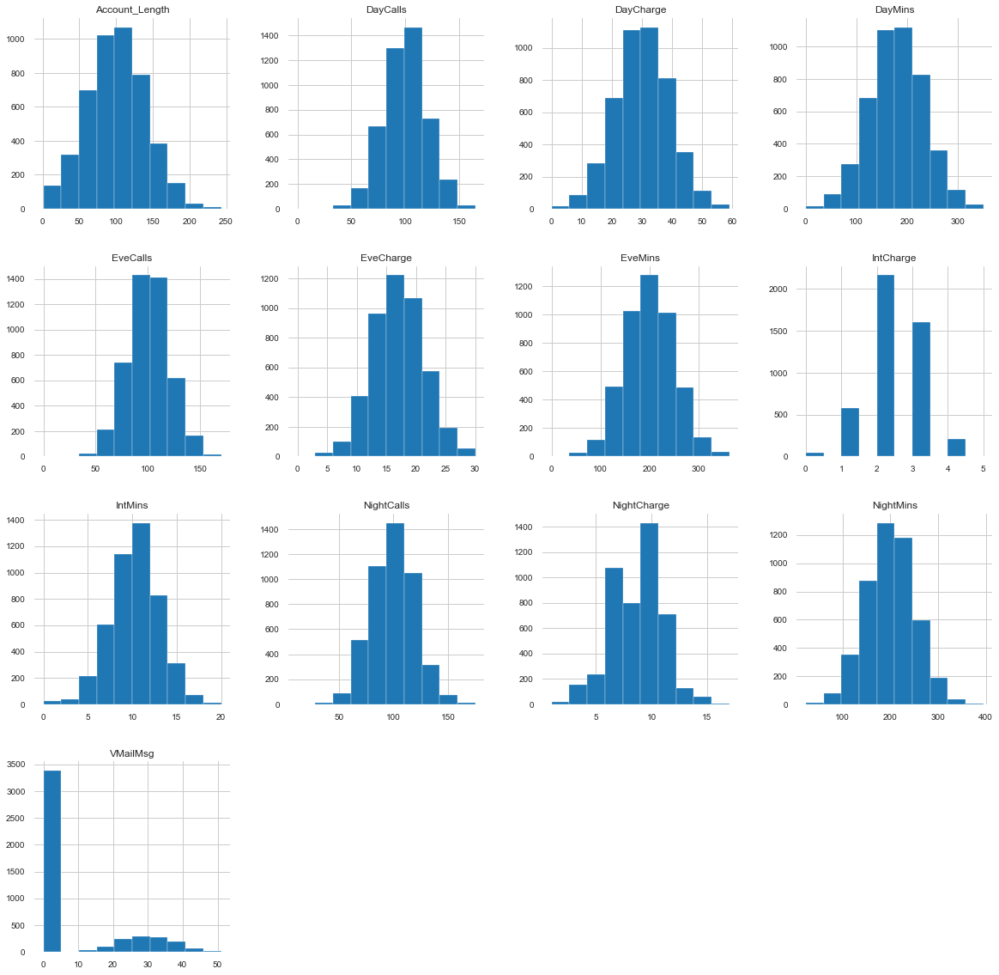

In [26]:
telecom_churn_data_enc[Convar_list].hist(figsize=(20,20))

### Plotting the top-10 important features

Feature importance refers to techniques that assign a score to input features based on how useful they are at predicting a target variable.

Feature importance scores play an important role in a predictive modeling project, including providing insight into the data, insight into the model, and the basis for dimensionality reduction and feature selection that can improve the efficiency and effectiveness of a predictive model on the problem.

In the below scenario, we have written a function to display the top-n important features. In our implementation, we are displaying the top-10 important features for our dataset using Random Forest classifier.

In [27]:
X_DT = telecom_churn_data_enc.drop(columns=['Churn_enc'], axis=1)
y_DT = telecom_churn_data_enc.Churn_enc

In [28]:
X_train_DT, X_test_DT, y_train_DT, y_test_DT = train_test_split(X_DT, y_DT, test_size=0.25, random_state=10)

In [29]:
XGBoostError = ""
LightGBMError = ""
ValueError = ""
def plot_feature_importances(clf, X_train, y_train=None, 
                             top_n=10, figsize=(8,8), print_table=False, title="Feature Importances"):
    '''
    plot feature importances of a tree-based sklearn estimator
    
    Note: X_train and y_train are pandas DataFrames
    
    Note: Scikit-plot is a lovely package but I sometimes have issues
              1. flexibility/extendibility
              2. complicated models/datasets
          But for many situations Scikit-plot is the way to go
          see https://scikit-plot.readthedocs.io/en/latest/Quickstart.html
    
    Parameters
    ----------
        clf         (sklearn estimator) if not fitted, this routine will fit it
        
        X_train     (pandas DataFrame)
        
        y_train     (pandas DataFrame)  optional
                                        required only if clf has not already been fitted 
        
        top_n       (int)               Plot the top_n most-important features
                                        Default: 10
                                        
        figsize     ((int,int))         The physical size of the plot
                                        Default: (8,8)
        
        print_table (boolean)           If True, print out the table of feature importances
                                        Default: False
        
    Returns
    -------
        the pandas dataframe with the features and their importance
        
    Author
    ------
        George Fisher
    '''
    
    __name__ = "plot_feature_importances"
    
    
    try: 
        if not hasattr(clf, 'feature_importances_'):
            clf.fit(X_train.values, y_train.values.ravel())

            if not hasattr(clf, 'feature_importances_'):
                raise AttributeError("{} does not have feature_importances_ attribute".
                                    format(clf.__class__.__name__))
                
    #except (XGBoostError, LightGBMError, ValueError):
    except:
        clf.fit(X_train.values, y_train.values.ravel())
            
    feat_imp = pd.DataFrame({'importance':clf.feature_importances_})    
    feat_imp['feature'] = X_train.columns
    feat_imp.sort_values(by='importance', ascending=False, inplace=True)
    feat_imp = feat_imp.iloc[:top_n]
    plt.rcParams.update({'figure.autolayout': True})
    #plt.rcParams["axes.edgecolor"] = "0.15"
    #plt.rcParams["axes.linewidth"]  = 1.25
    #plt.grid()

    feat_imp.sort_values(by='importance', inplace=True)
    feat_imp = feat_imp.set_index('feature', drop=True)
    feat_imp.plot.barh(figsize=figsize)
    #plt.title("Feature Importances", fontsize = 15, fontweight="bold")
    plt.xlabel('Feature Importance Score', fontsize = 15)
    plt.ylabel('Features', fontsize = 15)
    plt.savefig('Feature_Importance_before_scaling_ohe.png')
    plt.show()
    
    if print_table:
        from IPython.display import display
        print("Top {} features in descending order of importance".format(top_n))
        display(feat_imp.sort_values(by='importance', ascending=False))
        
    return feat_imp

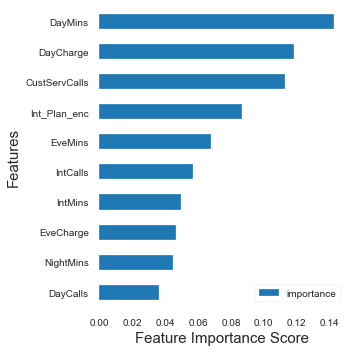

,importance
feature,
DayCalls,0.036414
NightMins,0.044916
EveCharge,0.046902
IntMins,0.049602
IntCalls,0.056969
EveMins,0.067793
Int_Plan_enc,0.086910
CustServCalls,0.112620
DayCharge,0.118560


In [30]:
plot_feature_importances(RandomForestClassifier(random_state=rand_state), X_train_DT, y_train_DT, top_n=10, figsize=(5,5))

### Decision Tree Visualization

Decision trees are relatively easy to interpret as we can visualize the Decision Trees. In the below implementation, we will export hte decision tree visualization to a PNG file and also import the PNG file to the Jupyter Notebook so that the end user can have a quick view.

Since the output on the Jupyter Notebook seems too cramped, we will also attach the .png file along with the submission.

In [31]:
clf = DecisionTreeClassifier(max_depth=4)
clf = clf.fit(X_train_DT,y_train_DT)
y_pred = clf.predict(X_test_DT)

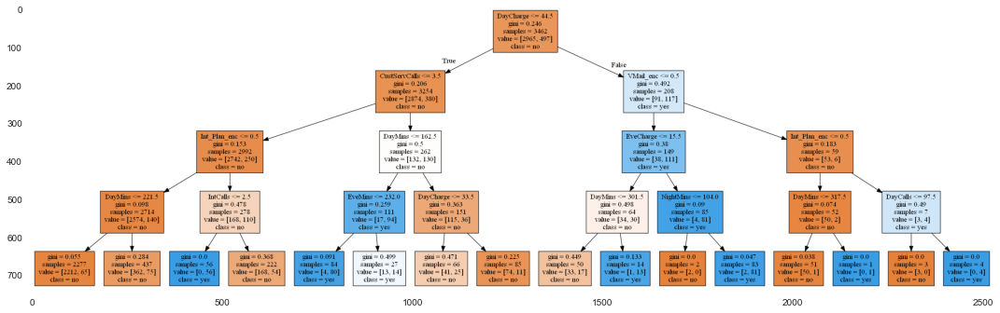

In [32]:
dot_data = tree.export_graphviz(clf, out_file=None, 
                                feature_names=X_train_DT.columns,  
                                class_names=['no', 'yes'],
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph
graph.render("DT")

plt.figure(figsize=(15,15))

img = mpimg.imread('DT.png')
imgplot = plt.imshow(img)
plt.show()

## Scaling the data set

It is a step of Data Pre Processing which is applied to independent variables or features of data. It basically helps to normalise the data within a particular range. Sometimes, it also helps in speeding up the calculations in an algorithm. The Features have been scaled to a mean of 0 and variance of 1 to improve accuracy of the classification models.

*fit_transform* within MinMaxScaler() function fits to data, then transform it. Fits transformer to X and y with optional parameters fit_params and returns a transformed version of X.

In [33]:
scaler = MinMaxScaler()

In [34]:
telecom_churn_data_enc_scaled = pd.DataFrame(scaler.fit_transform(telecom_churn_data_enc), columns=telecom_churn_data_enc.columns)

## Correlation Matrix

We used correlation plot to identify the attributes in the original dataset that appeared to be highly collinear (Greater than 0.8). In other words, one predictor variable in the regression model can be linearly predicted from the others with a substantial degree of accuracy.

corr = 1 were excluded to avoid displaying self correlated features.

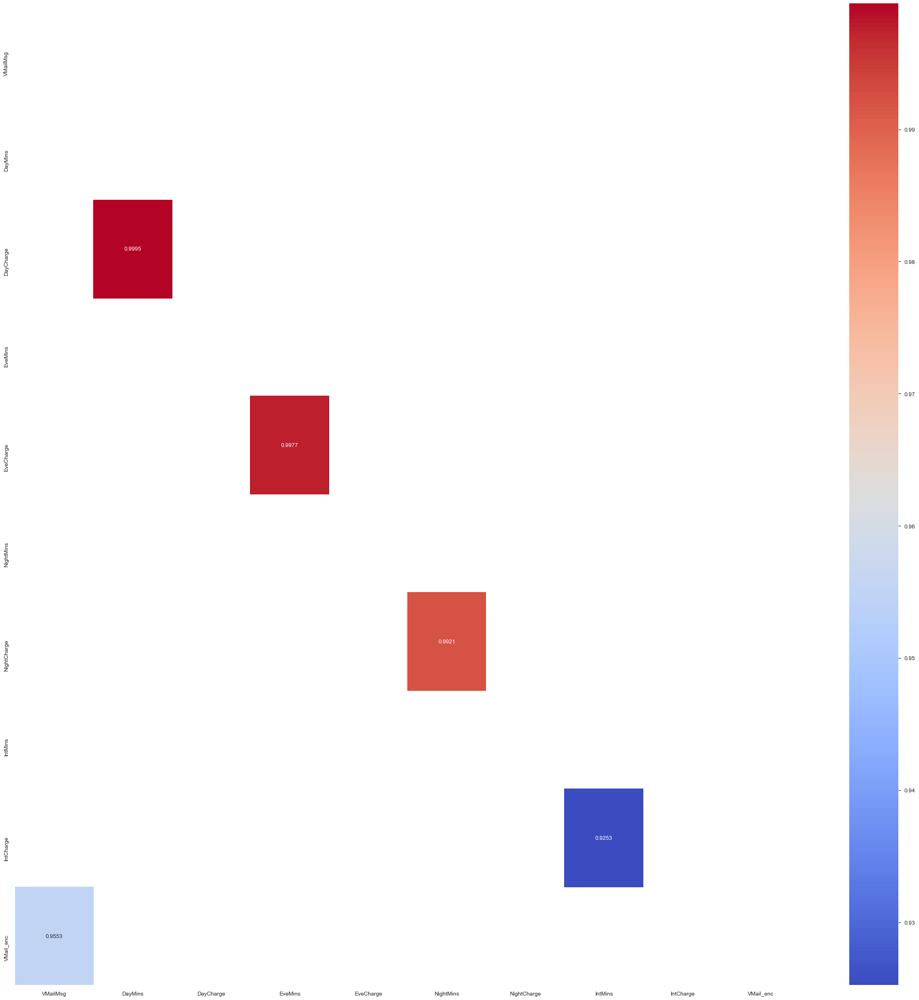

In [35]:
corr = telecom_churn_data_enc_scaled.corr()

kot = corr[(corr>=.8) & (corr<1)]
kot.dropna(axis=0, how='all', inplace = True)
kot.dropna(axis=1, how='all', inplace = True)
plt.figure(figsize=(25,25))
#sns.heatmap(kot, annot=True, fmt='.4g', cmap= 'coolwarm', linewidths=3, linecolor='black')

matrix = np.triu(kot)
sns.heatmap(kot, annot=True, fmt='.4g', cmap= 'coolwarm', mask = matrix)

In [36]:
kot

,VMailMsg,DayMins,DayCharge,EveMins,EveCharge,NightMins,NightCharge,IntMins,IntCharge,VMail_enc
VMailMsg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.95528
DayMins,NaN,NaN,0.999502,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DayCharge,NaN,0.999502,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EveMins,NaN,NaN,NaN,NaN,0.997663,NaN,NaN,NaN,NaN,NaN
EveCharge,NaN,NaN,NaN,0.997663,NaN,NaN,NaN,NaN,NaN,NaN
NightMins,NaN,NaN,NaN,NaN,NaN,NaN,0.992121,NaN,NaN,NaN
NightCharge,NaN,NaN,NaN,NaN,NaN,0.992121,NaN,NaN,NaN,NaN
IntMins,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.925258,NaN
IntCharge,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.925258,NaN,NaN
VMail_enc,0.95528,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Highly Correlated variables

- Based on the above analysis:
    - VMailMsg is highly correlated to VMail_enc feature
    - DayMins is highly correlated to DayCharge
    - EveMins is highly correlated to EveCharge
    - NightMins is highly correlated to NightCharge
    - IntMins is highly correlated to IntCharge
    
So, we proceed to drop the following columns:
- DayCharge, 
- EveCharge, 
- NightCharge, 
- IntCharge, 
- VMail_enc

In [37]:
corr_matrix = telecom_churn_data_enc_scaled.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]

to_drop

['DayCharge', 'EveCharge', 'NightCharge', 'IntCharge', 'VMail_enc']

In [38]:
telecom_churn_data_no_corr = telecom_churn_data_enc_scaled.drop(columns=to_drop, axis=1)

In [39]:
telecom_churn_data_no_corr.columns

Index(['Account_Length', 'VMailMsg', 'DayMins', 'DayCalls', 'EveMins',
       'EveCalls', 'NightMins', 'NightCalls', 'IntMins', 'IntCalls',
       'CustServCalls', 'State_enc', 'Area_Code_enc', 'Int_Plan_enc',
       'Churn_enc'],
      dtype='object')

### Profiling

We proceed to profile the final dataset that has no correlated columns.

In [40]:
ProfileReport(telecom_churn_data_no_corr)

## Balancing the dataset (Upsampling)

The attrition dataset is asymmetric and the model accuracy tends to be biased towards to the majority class. So, we synthetically balanced the dataset using the SMOTE method to upsample the minority class “Status = 1". Using this method, the number of observations in the minority class was increased to match the majority class. There was no change to the observations in the majority class. Balancing the dataset lets us use the Accuracy score along with Recall and Precision to compare model performance.

In [41]:
X = telecom_churn_data_no_corr.drop(columns=['Churn_enc'], axis=1)
y = telecom_churn_data_no_corr.Churn_enc

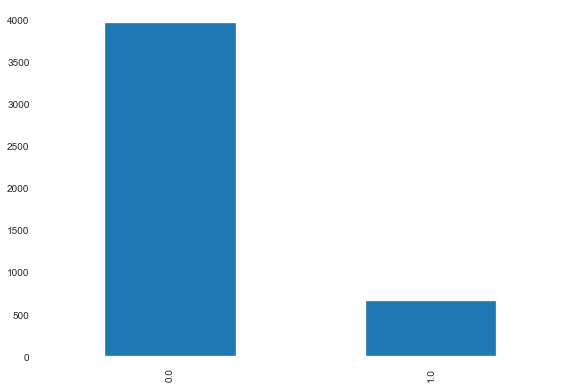

In [42]:
y.value_counts().plot(kind='bar')

In [43]:
smote = SMOTE()

In [44]:
X_smote, y_smote = smote.fit_sample(X.astype('float'), y)

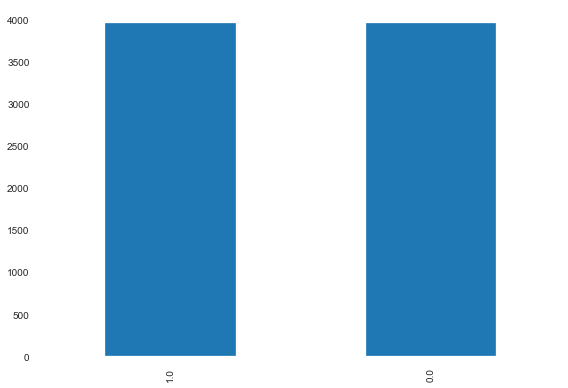

In [45]:
y_smote.value_counts().plot(kind='bar')

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, test_size=0.25, random_state=rand_state)

In [47]:
y_train.value_counts()

1.0    2976
0.0    2965
Name: Churn_enc, dtype: int64

In [48]:
y_test.value_counts()

0.0    996
1.0    985
Name: Churn_enc, dtype: int64

### Set Baseline of the metrics

We start with executing selective models with default parameters on the complete data set. The confusion matrix along with the classification report and the accuracy of the model is printed below. The function confusion_mat displays the confusion matrix (using pd.crosstab) and classification report. It additionally extracts the FP and FN case counts passes the results back so that they can be compiled into a dataframe and used for comparison at a later stage.

In order to set the baseline metrics, we execute the below models with default parameters and full features:
- Logistic Regression
- Support Vector Machine
- Gaussian Naive-Bayes
- Bernoulli Naive-Bayes
- Decision Trees
- Random Forest
- XGBoost

#### K-fold Cross-Validation

This is a statistical method of evaluating generalization performance that is more stable and thorough than using a split into a training and test set. In cross-validation, the data set is split multiple times and the model is trained on each of these splits. For our analysis, we will be using k-fold cross-validation. 

KFold divides all the samples in groups of samples, called folds (if , this is equivalent to the Leave One Out strategy), of equal sizes (if possible). The prediction function is learned using folds, and the fold left out is used for test.

Parameters for k-fold CV:
- n_splitsint - Number of folds
    - 5
- random_state - random_state is the seed used by the random number generator
    - 10

In [49]:
cv = KFold(n_splits=n_iterations, random_state=rand_state)

In [50]:
results_df = pd.DataFrame(columns=['Classifier', 'Features', 'Accuracy', 'Parameters', 'Recall', 
                                   'Precision', 'FPR', 'TPR', 'AUC', 'True_Positives', 
                                   'True_Negatives', 'False_Positives', 'False_Negatives'])
results_df

,Classifier,Features,Accuracy,Parameters,Recall,Precision,FPR,TPR,AUC,True_Positives,True_Negatives,False_Positives,False_Negatives


In [51]:
def confusion_mat(y_test, y_pred):
    print('Confusion Matrix::\n')
    print(pd.crosstab(y_test, y_pred))
    print()
    print('Classification Report::')
    print(classification_report(y_test, y_pred))
    TN = pd.crosstab(y_test, y_pred).iloc[0, 0]
    FP = pd.crosstab(y_test, y_pred).iloc[0, 1]
    FN = pd.crosstab(y_test, y_pred).iloc[1, 0]
    TP = pd.crosstab(y_test, y_pred).iloc[1, 1]
    Cost = (FP*10)+(FN*500)
    Recall = recall_score(y_test, y_pred)
    Precision = precision_score(y_test, y_pred)
    Accuracy = accuracy_score(y_test, y_pred)
    return(FP, FN, TP, TN, Accuracy, Recall, Precision)

In [52]:
clfsDict = {'Logistic Regression': LogisticRegression(solver = 'lbfgs', random_state=rand_state),
            'SVM (SVC)': SVC(gamma = 0.5, random_state=rand_state, probability=True), 
            'Gaussian Naive-Bayes': GaussianNB(),
            'Bernoulli Naive-Bayes': BernoulliNB(),
            'Decision Tree': DecisionTreeClassifier(random_state=rand_state),
            'Random Forest': RandomForestClassifier(n_estimators=100, random_state=rand_state),
            'XGB': XGBClassifier(random_state=rand_state)}

In [53]:
for mdl, clf in clfsDict.items():
    start_1 = time()
    acc = cross_val_score(clf,X_train,y=y_train,cv=cv)
    clf.fit(X_train, y_train)
    y_pred_full_data = clf.predict(X_test)
    y_pred_proba_full_data = clf.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test,  y_pred_proba_full_data)
    auc = roc_auc_score(y_test, y_pred_proba_full_data)
    (FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_full_data)
    results_df = results_df.append({'Classifier':mdl
                                    , 'Features':'Full'
                                    , 'Parameters': 'Default'
                                    , 'Accuracy': Accuracy
                                    , 'Recall': Recall
                                    , 'Precision': Precision
                                    , 'FPR': fpr
                                    , 'TPR': tpr
                                    , 'AUC': auc
                                    , 'True_Positives': TP
                                    , 'True_Negatives': TN
                                    , 'False_Positives': FP
                                    , 'False_Negatives': FN
                                   }
                                   , ignore_index=True
                                  )
    print()
    print('Process Time:: %0f' %(time()-start_1))
    print()

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        772  224
1.0        193  792

Classification Report::
              precision    recall  f1-score   support

         0.0       0.80      0.78      0.79       996
         1.0       0.78      0.80      0.79       985

    accuracy                           0.79      1981
   macro avg       0.79      0.79      0.79      1981
weighted avg       0.79      0.79      0.79      1981


Process Time:: 0.260283

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        844  152
1.0        117  868

Classification Report::
              precision    recall  f1-score   support

         0.0       0.88      0.85      0.86       996
         1.0       0.85      0.88      0.87       985

    accuracy                           0.86      1981
   macro avg       0.86      0.86      0.86      1981
weighted avg       0.86      0.86      0.86      1981


Process Time:: 18.115438

Confusion Matrix::

col_0      0.0  1.0
Chu

In [54]:
results_df

,Classifier,Features,Accuracy,Parameters,Recall,Precision,FPR,TPR,AUC,True_Positives,True_Negatives,False_Positives,False_Negatives
0,Logistic Regression,Full,0.789500,Default,0.804061,0.779528,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.020304568527918...",0.840741,792,772,224,193
1,SVM (SVC),Full,0.864210,Default,0.881218,0.850980,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.009137055837563...",0.916727,868,844,152,117
2,Gaussian Naive-Bayes,Full,0.818274,Default,0.775635,0.846069,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.042639593908629...",0.856355,764,857,139,221
3,Bernoulli Naive-Bayes,Full,0.645634,Default,0.867005,0.599298,"[0.0, 0.006024096385542169, 0.0371485943775100...","[0.0, 0.03857868020304569, 0.1918781725888325,...",0.700906,854,425,571,131
4,Decision Tree,Full,0.909137,Default,0.922843,0.897335,"[0.0, 0.10441767068273092, 1.0]","[0.0, 0.9228426395939087, 1.0]",0.909212,909,892,104,76
5,Random Forest,Full,0.956083,Default,0.947208,0.963843,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.06802030456852792, 0.15228426395939088...",0.992447,933,961,35,52
6,XGB,Full,0.974255,Default,0.962437,0.985447,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.003045685279187...",0.991661,948,982,14,37


# Feature Reduction (RFECV)

The classes in the sklearn.feature_selection module can be used for feature selection/dimensionality reduction on sample sets, either to improve estimators’ accuracy scores or to boost their performance on very high-dimensional datasets. We have used Recursive Feature Elimination with Cross-Validation to limit the number of features input to the model.

Given an external estimator that assigns weights to features (e.g., the coefficients of a linear model), recursive feature elimination (RFE) is to select features by recursively considering smaller and smaller sets of features. First, the estimator is trained on the initial set of features and the importance of each feature is obtained either through a coef_ attribute or through a feature_importances_ attribute. Then, the least important features are pruned from current set of features.That procedure is recursively repeated on the pruned set until the desired number of features to select is eventually reached.

RFECV performs RFE in a cross-validation loop to find the optimal number of features.

Parameters for RFECV:
- estimator - A supervised learning estimator with a fit method that provides information about feature importance.
    - RandomForestClassifier
- step - If greater than or equal to 1, then step corresponds to the number of features to remove at each iteration.
    - 4
- cv - Determines the cross-validation splitting strategy. Integer value specifies the number of folds.
    - 3
- scoring - A scoring method to determine which score to maximize
    - recall
    
##### Note: 
We dropped 4 features using RFECV. 

In [55]:
clf = RandomForestClassifier(n_estimators=100, random_state=rand_state)
selector = RFECV(estimator=clf, step = 4, cv=3, scoring='accuracy')

In [56]:
#%%time

feature_fit = selector.fit(X_train, y_train)

print('The number of selected features with CV:: ', feature_fit.n_features_)
print('Selected Features:: ', X_train.columns[selector.support_])

The number of selected features with CV::  10
Selected Features::  Index(['Account_Length', 'VMailMsg', 'DayMins', 'EveMins', 'NightMins',
       'IntMins', 'IntCalls', 'CustServCalls', 'State_enc', 'Int_Plan_enc'],
      dtype='object')


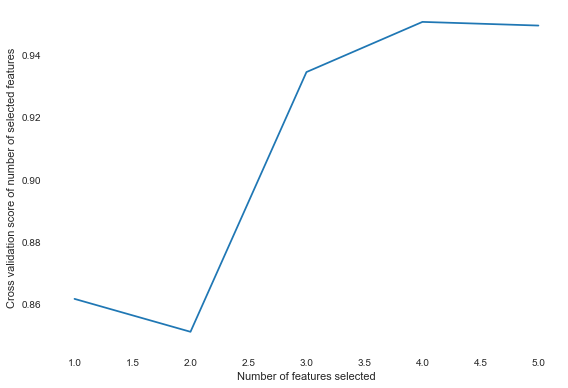

In [57]:
# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score of number of selected features")
plt.plot(range(1, len(selector.grid_scores_) + 1), selector.grid_scores_)
plt.show()

In [58]:
selector.grid_scores_

array([0.86147118, 0.85086623, 0.93452368, 0.95068266, 0.94950438])

In [59]:
X_train_reduced_features = X_train[X_train.columns[selector.support_]]
X_test_reduced_features = X_test[X_test.columns[selector.support_]]

In [60]:
X_train_reduced_features.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5941 entries, 5448 to 1289
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Account_Length  5941 non-null   float64
 1   VMailMsg        5941 non-null   float64
 2   DayMins         5941 non-null   float64
 3   EveMins         5941 non-null   float64
 4   NightMins       5941 non-null   float64
 5   IntMins         5941 non-null   float64
 6   IntCalls        5941 non-null   float64
 7   CustServCalls   5941 non-null   float64
 8   State_enc       5941 non-null   float64
 9   Int_Plan_enc    5941 non-null   float64
dtypes: float64(10)
memory usage: 510.6 KB


# Train the model on the reduced features

In this section all models use the default parameters to establish the baseline with reduced features before we tune the parameters using Randomized Search.

### Decision Tree

Decision trees can be applied to both regression and classification problems. While a regression tree is used to predict a quantitative response, a classification tree is used to predict a qualitative one. This algorithm constructs a tree from a training dataset in which each node is an attribute and branches are the corresponding values.

### Random Forest

Decision trees form the basis for Random Forests. Random Forest is an ensemble of decision trees trained via bagging method. The Random Forest algorithm introduces randomness when growing trees and rather than search for the best feature when splitting a node, it searches for the best feature among a random subset of features. It yeilds a better model by trading a higher bias for a lower variance. Random Forests are also very helpful to get a good understanding of feature importance when we need to perform feature selection.

### XGBoost

XGBoost is an optimized distributed gradient boosting library designed to be highly efficient, flexible and portable. It implements machine learning algorithms under the Gradient Boosting framework. XGBoost provides a parallel tree boosting (also known as GBDT, GBM) that solve many data science problems in a fast and accurate way. 

In [61]:
clfsDict = {#'Logistic Regression': LogisticRegression(solver = 'lbfgs', random_state=rand_state),
            #'SVM (SVC)': SVC(gamma = 0.5, random_state=rand_state, probability=True), 
            #'Gaussian Naive-Bayes': GaussianNB(),
            #'Bernoulli Naive-Bayes': BernoulliNB(),
            'Decision Tree': DecisionTreeClassifier(random_state=rand_state),
            'Random Forest': RandomForestClassifier(n_estimators=100, random_state=rand_state),
            'XGB': XGBClassifier(random_state=rand_state)}

In [62]:
for mdl, clf in clfsDict.items():
    start_1 = time()
    acc = cross_val_score(clf,X_train_reduced_features,y=y_train,cv=cv)
    clf.fit(X_train_reduced_features, y_train)
    y_pred_full_data = clf.predict(X_test_reduced_features)
    y_pred_proba_full_data = clf.predict_proba(X_test_reduced_features)[:, 1]
    fpr, tpr, _ = roc_curve(y_test,  y_pred_proba_full_data)
    auc = roc_auc_score(y_test, y_pred_proba_full_data)
    (FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_full_data)
    results_df = results_df.append({'Classifier':mdl
                                    , 'Features':'Reduced'
                                    , 'Parameters': 'Default'
                                    , 'Accuracy': Accuracy
                                    , 'Recall': Recall
                                    , 'Precision': Precision
                                    , 'FPR': fpr
                                    , 'TPR': tpr
                                    , 'AUC': auc
                                    , 'True_Positives': TP
                                    , 'True_Negatives': TN
                                    , 'False_Positives': FP
                                    , 'False_Negatives': FN
                                   }
                                   , ignore_index=True
                                  )
    print()
    print('Process Time:: %0f' %(time()-start_1))
    print()

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        899   97
1.0         77  908

Classification Report::
              precision    recall  f1-score   support

         0.0       0.92      0.90      0.91       996
         1.0       0.90      0.92      0.91       985

    accuracy                           0.91      1981
   macro avg       0.91      0.91      0.91      1981
weighted avg       0.91      0.91      0.91      1981


Process Time:: 0.275263

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        963   33
1.0         55  930

Classification Report::
              precision    recall  f1-score   support

         0.0       0.95      0.97      0.96       996
         1.0       0.97      0.94      0.95       985

    accuracy                           0.96      1981
   macro avg       0.96      0.96      0.96      1981
weighted avg       0.96      0.96      0.96      1981


Process Time:: 4.498122

Confusion Matrix::

col_0      0.0  1.0
Chur

In [63]:
results_df.sort_values(by='AUC', ascending=True)

,Classifier,Features,Accuracy,Parameters,Recall,Precision,FPR,TPR,AUC,True_Positives,True_Negatives,False_Positives,False_Negatives
3,Bernoulli Naive-Bayes,Full,0.645634,Default,0.867005,0.599298,"[0.0, 0.006024096385542169, 0.0371485943775100...","[0.0, 0.03857868020304569, 0.1918781725888325,...",0.700906,854,425,571,131
0,Logistic Regression,Full,0.789500,Default,0.804061,0.779528,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.020304568527918...",0.840741,792,772,224,193
2,Gaussian Naive-Bayes,Full,0.818274,Default,0.775635,0.846069,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.042639593908629...",0.856355,764,857,139,221
4,Decision Tree,Full,0.909137,Default,0.922843,0.897335,"[0.0, 0.10441767068273092, 1.0]","[0.0, 0.9228426395939087, 1.0]",0.909212,909,892,104,76
7,Decision Tree,Reduced,0.912166,Default,0.921827,0.903483,"[0.0, 0.09738955823293173, 1.0]","[0.0, 0.9218274111675127, 1.0]",0.912219,908,899,97,77
1,SVM (SVC),Full,0.864210,Default,0.881218,0.850980,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.009137055837563...",0.916727,868,844,152,117
9,XGB,Reduced,0.972236,Default,0.957360,0.986402,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0020304568527918783, 0.005076142131979...",0.990390,943,983,13,42
8,Random Forest,Reduced,0.955578,Default,0.944162,0.965732,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.17258883248730963, 0.30253807106598984...",0.990991,930,963,33,55
6,XGB,Full,0.974255,Default,0.962437,0.985447,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.003045685279187...",0.991661,948,982,14,37
5,Random Forest,Full,0.956083,Default,0.947208,0.963843,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.06802030456852792, 0.15228426395939088...",0.992447,933,961,35,52


# GridSearchCV to choose best parameters

GridSearchCV implements a “fit” and a “score” method. It also implements “predict”, “predict_proba”, “decision_function”, “transform” and “inverse_transform” if they are implemented in the estimator used. The parameters of the estimator used to apply these methods are optimized by cross-validated grid-search over a parameter grid.

#### Options for RandomizedSearchCV
- estimator - A object of that type is instantiated for each grid point.
    - Assigned as per the algorithm we are tuning
- param_distributions - Dictionary with parameters names (string) as keys and distributions or lists of parameters to try.
    - Assigned as per the algorithm we are tuning
- scoring - A single string to evaluate the predictions on the test set.
    - ['precision' , 'recall' , 'accuracy']
- cv - Determines the cross-validation splitting strategy.
    - 5
- refit - Refit an estimator using the best found parameters on the whole dataset.
    - recall

In [64]:
scores = ['precision'
          , 'recall'
          , 'accuracy'
         ]

In [65]:
def report_perf(clf, n_top = 3, clf_name = "", verbose=True):
    if(verbose):
        for n in range(1, n_top+1):
            candidates = np.flatnonzero(clf.cv_results_['rank_test_recall'] == n)
            for candidate in candidates:
                print('Model with rank: {0}'.format(n))
                print('Mean validation score (Recall on Test): {0:.3f} (std: {1:.3f})'.format(
                    clf.cv_results_['mean_test_recall'][candidate], clf.cv_results_['std_test_recall'][candidate]))
                print('ParametersL {0}',format(clf.cv_results_['params'][candidate]))
    return{'Classifier': clf_name
           , 'Best_Parameters': str(clf.best_params_)
           , 'Best_Estimator': str(clf.best_estimator_)
#           , 'Accuracy_Mean':clf.cv_results_['mean_test_acc'][clf.best_index_]
#           , 'Accuracy_std':clf.cv_results_['std_test_acc'][clf.best_index_]
           , 'Precision_Mean':clf.cv_results_['mean_test_precision'][clf.best_index_]
           , 'Precision_std':clf.cv_results_['std_test_precision'][clf.best_index_]
           , 'Recall_Mean':clf.cv_results_['mean_test_recall'][clf.best_index_]
           , 'Recall_std':clf.cv_results_['std_test_recall'][clf.best_index_]
          }

### Decision Tree

We are tuning for the following parameters for *Decision Tree Classifier*:
- max_depth: The maximum depth of the tree.
    - [10, 20, 30, None]
- max_features: The number of features to consider when looking for the best split
    - ['auto', 'sqrt']
- criterion: The function to measure the quality of a split. Supported criteria are "gini" for the Gini impurity and "entropy" for the information gain.
    - ['gini','entropy']
- min_samples_leaf: The minimum number of samples required to be at a leaf node.  
    - [1, 2, 4]
- min_samples_split: The minimum number of samples required to split an internal node
    - [2, 5, 10]
- random_state - If int, random_state is the seed used by the random number generator
    - 10

In [66]:
tuned_parameters_DT={'max_depth': [10, 20, 30, None]
                     , 'max_features': ['auto', 'sqrt']
                     , 'criterion':['gini','entropy']
                     , 'min_samples_leaf': [1, 2, 4]
                     , 'min_samples_split': [2, 5, 10]
                    }

clf_DT = DecisionTreeClassifier(random_state=rand_state)

In [67]:
#%%time

grid_search_DT = GridSearchCV(estimator=clf_DT
                                      , param_grid=tuned_parameters_DT
                                      , cv = cv
                                      , scoring = scores
                                      , refit ='recall'
                                      #, n_iter=10
                                     )

In [68]:
grid_search_DT.fit(X_train_reduced_features, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=10, shuffle=False),
             error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=10,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_

In [69]:
DT_report = report_perf(grid_search_DT, n_top = 3, clf_name='Decision_Tree')
DT_report

Model with rank: 1
Mean validation score (Recall on Test): 0.908 (std: 0.011)
ParametersL {0} {'criterion': 'entropy', 'max_depth': 20, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2}
Model with rank: 1
Mean validation score (Recall on Test): 0.908 (std: 0.011)
ParametersL {0} {'criterion': 'entropy', 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2}
Model with rank: 3
Mean validation score (Recall on Test): 0.906 (std: 0.008)
ParametersL {0} {'criterion': 'entropy', 'max_depth': 30, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2}
Model with rank: 3
Mean validation score (Recall on Test): 0.906 (std: 0.008)
ParametersL {0} {'criterion': 'entropy', 'max_depth': 30, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2}


{'Classifier': 'Decision_Tree',
 'Best_Parameters': "{'criterion': 'entropy', 'max_depth': 20, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2}",
 'Best_Estimator': "DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',\n                       max_depth=20, max_features='auto', max_leaf_nodes=None,\n                       min_impurity_decrease=0.0, min_impurity_split=None,\n                       min_samples_leaf=1, min_samples_split=2,\n                       min_weight_fraction_leaf=0.0, presort='deprecated',\n                       random_state=10, splitter='best')",
 'Precision_Mean': 0.9089299964278433,
 'Precision_std': 0.014432817675601976,
 'Recall_Mean': 0.9079856124992874,
 'Recall_std': 0.011167611975699003}

### Random Forest

We are tuning the following parameters for Random Forest Classifier:
- n_estimators: The number of trees in the forest.
    - [100, 200]
- max_depth: The maximum depth of the tree.
    - [25, 50, None]
- criterion: The function to measure the quality of a split. Supported criteria are "gini" for the Gini impurity and "entropy" for the information gain.
    - ['gini','entropy']
- min_samples_leaf: The minimum number of samples required to be at a leaf node.
    - [1, 25, 50]
- max_features: The number of features to consider when looking for the best split.
    - [.2, .3, 'auto']
- min_samples_split: The minimum number of samples required to split an internal node.
    - [2, 4, 8, 10, 12]

In [70]:
tuned_parameters_RF={'n_estimators':[100, 200]
                     , 'max_depth':[25, 50, None]
                     , 'criterion':['gini','entropy']
                     , 'min_samples_leaf': [1, 25, 50]
                     , 'max_features':[.2, .3, 'auto']
                     , 'min_samples_split':[2, 4, 8, 10, 12]
                    }

clf_RF = RandomForestClassifier(random_state=rand_state)

In [71]:
#%%time

grid_search_RF = GridSearchCV(estimator=clf_RF
                                      #, param_distributions=tuned_parameters_RF
                                      , param_grid=tuned_parameters_RF
                                      , cv = cv
                                      , scoring = scores
                                      , refit = 'recall'
                                      #, n_iter=10
                                     )

grid_search_RF.fit(X_train_reduced_features, y_train)

RF_report = report_perf(grid_search_RF, n_top = 3, clf_name='Random_Forest')

Model with rank: 1
Mean validation score (Recall on Test): 0.946 (std: 0.012)
ParametersL {0} {'criterion': 'entropy', 'max_depth': 50, 'max_features': 0.3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Model with rank: 1
Mean validation score (Recall on Test): 0.946 (std: 0.012)
ParametersL {0} {'criterion': 'entropy', 'max_depth': 50, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Model with rank: 1
Mean validation score (Recall on Test): 0.946 (std: 0.012)
ParametersL {0} {'criterion': 'entropy', 'max_depth': None, 'max_features': 0.3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Model with rank: 1
Mean validation score (Recall on Test): 0.946 (std: 0.012)
ParametersL {0} {'criterion': 'entropy', 'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


In [72]:
RF_report

{'Classifier': 'Random_Forest',
 'Best_Parameters': "{'criterion': 'entropy', 'max_depth': 50, 'max_features': 0.3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}",
 'Best_Estimator': "RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,\n                       criterion='entropy', max_depth=50, max_features=0.3,\n                       max_leaf_nodes=None, max_samples=None,\n                       min_impurity_decrease=0.0, min_impurity_split=None,\n                       min_samples_leaf=1, min_samples_split=2,\n                       min_weight_fraction_leaf=0.0, n_estimators=200,\n                       n_jobs=None, oob_score=False, random_state=10, verbose=0,\n                       warm_start=False)",
 'Precision_Mean': 0.9645551272507461,
 'Precision_std': 0.008784284136564345,
 'Recall_Mean': 0.9463829824393152,
 'Recall_std': 0.01198113179863147}

### XGBoost

We are tuning the following parameters for XGBoost:
- n_estimators: Number of gradient boosted trees. Equivalent to number of boosting rounds.
    - [100, 150, 1000]
- learning_rate: Boosting learning rate (xgb’s “eta”)
    - [0.01, 0.6, None]
- subsample: Subsample ratio of the training instances.
    - [0.3, 0.9, None]
- max_depth: Maximum depth of a tree.
    - [3, 4, 5, 6, 7, 8, 9, None]
- colsample_bytree: The subsample ratio of columns when constructing each tree. Subsampling occurs once for every tree constructed.
    - [0.5, 0.9, None]
- min_child_weight: Minimum sum of instance weight (hessian) needed in a child.
    - [1, 2, 3, 4, None]

In [73]:
tuned_parameters_XGB={'n_estimators': [100, 150, 1000]
                      , 'learning_rate': [0.01, 0.6, None]
                      , 'subsample': [0.3, 0.9, None]
                      , 'max_depth': [3, 4, 5, 6, 7, 8, 9, None]
                      , 'colsample_bytree': [0.5, 0.9, None]
                      , 'min_child_weight': [1, 2, 3, 4, None]
                     }

clf_XGB = XGBClassifier(random_state=rand_state)

In [74]:
#%%time

grid_search_XGB = GridSearchCV(estimator=clf_XGB
                                      #, param_distributions=tuned_parameters_XGB
                                      , param_grid=tuned_parameters_RF
                                      , cv = cv
                                      , scoring = scores
                                      , refit ='recall'
                                      #, n_iter=10
                                     )

In [75]:
grid_search_XGB.fit(X_train_reduced_features, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=10, shuffle=False),
             error_score=nan,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None...
                                     verbosity=None),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [25, 50, None],
                         'max_features': [0.2, 0.3, 'auto'],
                         'min_samples_leaf': [1, 25, 50],
               

In [76]:
XGB_report = report_perf(grid_search_XGB, n_top = 3, clf_name='XGBoost')

Model with rank: 1
Mean validation score (Recall on Test): 0.966 (std: 0.010)
ParametersL {0} {'criterion': 'gini', 'max_depth': 25, 'max_features': 0.2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Model with rank: 1
Mean validation score (Recall on Test): 0.966 (std: 0.010)
ParametersL {0} {'criterion': 'gini', 'max_depth': 25, 'max_features': 0.2, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 200}
Model with rank: 1
Mean validation score (Recall on Test): 0.966 (std: 0.010)
ParametersL {0} {'criterion': 'gini', 'max_depth': 25, 'max_features': 0.2, 'min_samples_leaf': 1, 'min_samples_split': 8, 'n_estimators': 200}
Model with rank: 1
Mean validation score (Recall on Test): 0.966 (std: 0.010)
ParametersL {0} {'criterion': 'gini', 'max_depth': 25, 'max_features': 0.2, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}
Model with rank: 1
Mean validation score (Recall on Test): 0.966 (std: 0.010)
ParametersL {0} {'criterion': 'gi

### Append random_state to the best parameters

We assign the best parameters from each of the Random Search to a variable and then add the random state parameter to it. These variables will be passed on to train the models with reduced features and best parameters.

In [77]:
DT_best_params = grid_search_DT.best_params_
DT_best_params['random_state'] = rand_state

RF_best_params = grid_search_RF.best_params_
RF_best_params['random_state'] = rand_state

XGB_best_params = grid_search_XGB.best_params_
XGB_best_params['random_state'] = rand_state

### Train the model with the best parameters.

In [78]:
clfsDict = {#'Logistic Regression': LogisticRegression(solver = 'lbfgs', random_state=rand_state),
            #'SVM (SVC)': SVC(gamma = 0.5, random_state=rand_state, probability=True), 
            #'Gaussian Naive-Bayes': GaussianNB(),
            #'Bernoulli Naive-Bayes': BernoulliNB(),
            'Decision Tree': DecisionTreeClassifier(**DT_best_params),
            'Random Forest': RandomForestClassifier(**RF_best_params),
            'XGB': XGBClassifier(**XGB_best_params)}

In [79]:
for mdl, clf in clfsDict.items():
    start_1 = time()
    acc = cross_val_score(clf,X_train_reduced_features,y=y_train,cv=cv)
    clf.fit(X_train_reduced_features, y_train)
    y_pred_full_data = clf.predict(X_test_reduced_features)
    y_pred_proba_full_data = clf.predict_proba(X_test_reduced_features)[:, 1]
    fpr, tpr, _ = roc_curve(y_test,  y_pred_proba_full_data)
    auc = roc_auc_score(y_test, y_pred_proba_full_data)
    (FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_full_data)
    results_df = results_df.append({'Classifier':mdl
                                    , 'Features':'Reduced'
                                    , 'Parameters': 'Best'
                                    , 'Accuracy': Accuracy
                                    , 'Recall': Recall
                                    , 'Precision': Precision
                                    , 'FPR': fpr
                                    , 'TPR': tpr
                                    , 'AUC': auc
                                    , 'True_Positives': TP
                                    , 'True_Negatives': TN
                                    , 'False_Positives': FP
                                    , 'False_Negatives': FN
                                   }
                                   , ignore_index=True
                                  )
    print()
    print('Process Time:: %0f' %(time()-start_1))
    print()

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        900   96
1.0         94  891

Classification Report::
              precision    recall  f1-score   support

         0.0       0.91      0.90      0.90       996
         1.0       0.90      0.90      0.90       985

    accuracy                           0.90      1981
   macro avg       0.90      0.90      0.90      1981
weighted avg       0.90      0.90      0.90      1981


Process Time:: 0.235424

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        966   30
1.0         53  932

Classification Report::
              precision    recall  f1-score   support

         0.0       0.95      0.97      0.96       996
         1.0       0.97      0.95      0.96       985

    accuracy                           0.96      1981
   macro avg       0.96      0.96      0.96      1981
weighted avg       0.96      0.96      0.96      1981


Process Time:: 12.425981

Confusion Matrix::

col_0      0.0  1.0
Chu

In [80]:
results_df.sort_values(by='AUC', ascending=True)

,Classifier,Features,Accuracy,Parameters,Recall,Precision,FPR,TPR,AUC,True_Positives,True_Negatives,False_Positives,False_Negatives
3,Bernoulli Naive-Bayes,Full,0.645634,Default,0.867005,0.599298,"[0.0, 0.006024096385542169, 0.0371485943775100...","[0.0, 0.03857868020304569, 0.1918781725888325,...",0.700906,854,425,571,131
0,Logistic Regression,Full,0.789500,Default,0.804061,0.779528,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.020304568527918...",0.840741,792,772,224,193
2,Gaussian Naive-Bayes,Full,0.818274,Default,0.775635,0.846069,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.042639593908629...",0.856355,764,857,139,221
10,Decision Tree,Reduced,0.904089,Best,0.904569,0.902736,"[0.0, 0.09437751004016064, 0.0963855421686747,...","[0.0, 0.9035532994923858, 0.9045685279187817, ...",0.904301,891,900,96,94
4,Decision Tree,Full,0.909137,Default,0.922843,0.897335,"[0.0, 0.10441767068273092, 1.0]","[0.0, 0.9228426395939087, 1.0]",0.909212,909,892,104,76
7,Decision Tree,Reduced,0.912166,Default,0.921827,0.903483,"[0.0, 0.09738955823293173, 1.0]","[0.0, 0.9218274111675127, 1.0]",0.912219,908,899,97,77
1,SVM (SVC),Full,0.864210,Default,0.881218,0.850980,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.009137055837563...",0.916727,868,844,152,117
9,XGB,Reduced,0.972236,Default,0.957360,0.986402,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0020304568527918783, 0.005076142131979...",0.990390,943,983,13,42
8,Random Forest,Reduced,0.955578,Default,0.944162,0.965732,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.17258883248730963, 0.30253807106598984...",0.990991,930,963,33,55
6,XGB,Full,0.974255,Default,0.962437,0.985447,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.003045685279187...",0.991661,948,982,14,37


In [81]:
clf_DT_best = DecisionTreeClassifier(**DT_best_params)
clf_RF_best = RandomForestClassifier(**RF_best_params)
clf_XGB_Best = XGBClassifier(**XGB_best_params)

In [82]:
models_1 = [clf_DT_best
            , clf_RF_best]

# Get out-of-fold predictions from 1-level models
S_1_train, S_1_test = stacking(models_1
                               , X_train_reduced_features
                               , y_train
                               , X_test_reduced_features
                               , regression = True
                               , metric=precision_score
                               , verbose = 2)

task:         [regression]
metric:       [precision_score]
mode:         [oof_pred_bag]
n_models:     [2]

model  0:     [DecisionTreeClassifier]
    fold  0:  [0.88016529]
    fold  1:  [0.91784703]
    fold  2:  [0.90463215]
    fold  3:  [0.89226869]
    ----
    MEAN:     [0.89872829] + [0.01402402]
    FULL:     [0.89847716]

model  1:     [RandomForestClassifier]
    fold  0:  [0.95664740]
    fold  1:  [0.97375691]
    fold  2:  [0.96121884]
    fold  3:  [0.96498054]
    ----
    MEAN:     [0.96415092] + [0.00628218]
    FULL:     [0.96424888]



In [83]:
# Initialize 2-level models
models_2 = [clf_XGB_Best]

# Get out-of-fold predictions from 2-level models
S_2_train, S_2_test = stacking(models_2
                               , S_1_train
                               , y_train
                               , S_1_test
                               , regression = True
                               , metric=precision_score
                               , verbose = 2)

task:         [regression]
metric:       [precision_score]
mode:         [oof_pred_bag]
n_models:     [1]

model  0:     [XGBClassifier]
    fold  0:  [0.95664740]
    fold  1:  [0.97375691]
    fold  2:  [0.96121884]
    fold  3:  [0.96498054]
    ----
    MEAN:     [0.96415092] + [0.00628218]
    FULL:     [0.96424888]



In [84]:
# Initialize 3-level model
model = LogisticRegression(random_state=rand_state)
# Fit
model.fit(S_2_train, y_train)
# Get final prediction
y_pred_ensemble = model.predict(S_2_test)

In [85]:
model.predict_proba(S_2_test)

array([[0.9416171 , 0.0583829 ],
       [0.9416171 , 0.0583829 ],
       [0.9416171 , 0.0583829 ],
       ...,
       [0.03781951, 0.96218049],
       [0.03781951, 0.96218049],
       [0.9416171 , 0.0583829 ]])

In [86]:
y_pred_proba = model.predict_proba(S_2_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)

(FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_ensemble)
results_df = results_df.append({'Classifier':'Vecstack'
                                , 'Features':'Reduced'
                                , 'Parameters': 'Best'
                                , 'Accuracy': Accuracy
                                , 'Recall': Recall
                                , 'Precision': Precision
                                , 'FPR': fpr
                                , 'TPR': tpr
                                , 'AUC': auc
                                , 'True_Positives': TP
                                , 'True_Negatives': TN
                                , 'False_Positives': FP
                                , 'False_Negatives': FN
                               }
                               , ignore_index=True
                              )

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        960   36
1.0         49  936

Classification Report::
              precision    recall  f1-score   support

         0.0       0.95      0.96      0.96       996
         1.0       0.96      0.95      0.96       985

    accuracy                           0.96      1981
   macro avg       0.96      0.96      0.96      1981
weighted avg       0.96      0.96      0.96      1981



In [87]:
sclf = StackingCVClassifier(classifiers=[clf_DT_best, clf_RF_best, clf_XGB_Best]
                            , use_probas=True
                            , random_state= rand_state
                            , meta_classifier=LogisticRegression(random_state=rand_state))

In [88]:
label = ['Decision Tree', 'Random Forest', 'XGBoost', 'Stacking Classifier']
clf_list = [clf_DT_best, clf_RF_best, clf_XGB_Best, sclf]
    
sclf.fit(X_train_reduced_features, y_train)
y_pred_sclf = sclf.predict(X_test_reduced_features)

In [89]:
y_pred_proba = sclf.predict_proba(X_test_reduced_features)[:, 1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)

(FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_sclf)
results_df = results_df.append({'Classifier':'StackingCV'
                                , 'Features':'Reduced'
                                , 'Parameters': 'Best'
                                , 'Accuracy': Accuracy
                                , 'Recall': Recall
                                , 'Precision': Precision
                                , 'FPR': fpr
                                , 'TPR': tpr
                                , 'AUC': auc
                                , 'True_Positives': TP
                                , 'True_Negatives': TN
                                , 'False_Positives': FP
                                , 'False_Negatives': FN
                               }
                               , ignore_index=True
                              )

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        981   15
1.0         36  949

Classification Report::
              precision    recall  f1-score   support

         0.0       0.96      0.98      0.97       996
         1.0       0.98      0.96      0.97       985

    accuracy                           0.97      1981
   macro avg       0.97      0.97      0.97      1981
weighted avg       0.97      0.97      0.97      1981



In [90]:
final_layer = StackingClassifier(estimators=[('rf', clf_RF_best)
                                            , ('xgb', clf_XGB_Best)]
                                , final_estimator=LogisticRegression(random_state=rand_state)
                               )

multi_layer_regressor = StackingClassifier(estimators=[('dt', clf_DT_best)]
                                          , final_estimator=final_layer
                                         )

multi_layer_regressor.fit(X_train_reduced_features, y_train)

y_pred_multi = multi_layer_regressor.predict(X_test_reduced_features)

In [91]:
y_pred_proba = multi_layer_regressor.predict_proba(X_test_reduced_features)[:, 1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)

(FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_multi)
results_df = results_df.append({'Classifier':'Stacking (Logistic)'
                                , 'Features':'Reduced'
                                , 'Parameters': 'Best'
                                , 'Accuracy': Accuracy
                                , 'Recall': Recall
                                , 'Precision': Precision
                                , 'FPR': fpr
                                , 'TPR': tpr
                                , 'AUC': auc
                                , 'True_Positives': TP
                                , 'True_Negatives': TN
                                , 'False_Positives': FP
                                , 'False_Negatives': FN
                               }
                               , ignore_index=True
                              )

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        900   96
1.0         94  891

Classification Report::
              precision    recall  f1-score   support

         0.0       0.91      0.90      0.90       996
         1.0       0.90      0.90      0.90       985

    accuracy                           0.90      1981
   macro avg       0.90      0.90      0.90      1981
weighted avg       0.90      0.90      0.90      1981



In [92]:
ensemble_estimators = [('rf', clf_RF_best)
                       , ('xgb', clf_XGB_Best)
                       , ('dt', clf_DT_best)
#                       , ('logistic', LogisticRegression(random_state=rand_state))
                      ]

clf_ensemble = StackingClassifier(estimators=ensemble_estimators
                                  , final_estimator=CalibratedClassifierCV(SGDClassifier(random_state=rand_state))
#                                  , final_estimator=SVC(gamma = 0.5, random_state=rand_state)
                                 )

clf_ensemble.fit(X_train_reduced_features, y_train)

StackingClassifier(cv=None,
                   estimators=[('rf',
                                RandomForestClassifier(bootstrap=True,
                                                       ccp_alpha=0.0,
                                                       class_weight=None,
                                                       criterion='entropy',
                                                       max_depth=50,
                                                       max_features=0.3,
                                                       max_leaf_nodes=None,
                                                       max_samples=None,
                                                       min_impurity_decrease=0.0,
                                                       min_impurity_split=None,
                                                       min_samples_leaf=1,
                                                       min_samples_split=2,
                                       

In [93]:
y_pred_ens = clf_ensemble.predict(X_test_reduced_features)

In [94]:
y_pred_proba = clf_ensemble.predict_proba(X_test_reduced_features)[:, 1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)

(FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_ens)
results_df = results_df.append({'Classifier':'Stacking (SGD)'
                                , 'Features':'Reduced'
                                , 'Parameters': 'Best'
                                , 'Accuracy': Accuracy
                                , 'Recall': Recall
                                , 'Precision': Precision
                                , 'FPR': fpr
                                , 'TPR': tpr
                                , 'AUC': auc
                                , 'True_Positives': TP
                                , 'True_Negatives': TN
                                , 'False_Positives': FP
                                , 'False_Negatives': FN
                               }
                               , ignore_index=True
                              )

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        980   16
1.0         35  950

Classification Report::
              precision    recall  f1-score   support

         0.0       0.97      0.98      0.97       996
         1.0       0.98      0.96      0.97       985

    accuracy                           0.97      1981
   macro avg       0.97      0.97      0.97      1981
weighted avg       0.97      0.97      0.97      1981



In [95]:
ensemble_estimators_5 = [('rf', clf_RF_best)
                       , ('xgb', clf_XGB_Best)
                       , ('dt', clf_DT_best)
#                       , ('logistic', LogisticRegression(random_state=rand_state))
                      ]

clf_ensemble_5 = StackingClassifier(estimators=ensemble_estimators_5
#                                   , final_estimator=SGDClassifier(random_state=rand_state)
                                    , final_estimator=CalibratedClassifierCV(SVC(gamma = 0.5, random_state=rand_state))
                                 )

clf_ensemble_5.fit(X_train_reduced_features, y_train)

StackingClassifier(cv=None,
                   estimators=[('rf',
                                RandomForestClassifier(bootstrap=True,
                                                       ccp_alpha=0.0,
                                                       class_weight=None,
                                                       criterion='entropy',
                                                       max_depth=50,
                                                       max_features=0.3,
                                                       max_leaf_nodes=None,
                                                       max_samples=None,
                                                       min_impurity_decrease=0.0,
                                                       min_impurity_split=None,
                                                       min_samples_leaf=1,
                                                       min_samples_split=2,
                                       

In [96]:
y_pred_ens_5 = clf_ensemble_5.predict(X_test_reduced_features)

In [97]:
y_pred_proba = clf_ensemble_5.predict_proba(X_test_reduced_features)[:, 1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)

(FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_ens_5)
results_df = results_df.append({'Classifier':'Stacking (SVC)'
                                , 'Features':'Reduced'
                                , 'Parameters': 'Best'
                                , 'Accuracy': Accuracy
                                , 'Recall': Recall
                                , 'Precision': Precision
                                , 'FPR': fpr
                                , 'TPR': tpr
                                , 'AUC': auc
                                , 'True_Positives': TP
                                , 'True_Negatives': TN
                                , 'False_Positives': FP
                                , 'False_Negatives': FN
                               }
                               , ignore_index=True
                              )

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        981   15
1.0         39  946

Classification Report::
              precision    recall  f1-score   support

         0.0       0.96      0.98      0.97       996
         1.0       0.98      0.96      0.97       985

    accuracy                           0.97      1981
   macro avg       0.97      0.97      0.97      1981
weighted avg       0.97      0.97      0.97      1981



In [98]:
clf_ensemble_6 = VotingClassifier(estimators=[('rf', clf_RF_best)
                                              , ('xgb', clf_XGB_Best)
                                              , ('dt', clf_DT_best)]
                                  , voting='soft')

clf_ensemble_6.fit(X_train_reduced_features, y_train)

VotingClassifier(estimators=[('rf',
                              RandomForestClassifier(bootstrap=True,
                                                     ccp_alpha=0.0,
                                                     class_weight=None,
                                                     criterion='entropy',
                                                     max_depth=50,
                                                     max_features=0.3,
                                                     max_leaf_nodes=None,
                                                     max_samples=None,
                                                     min_impurity_decrease=0.0,
                                                     min_impurity_split=None,
                                                     min_samples_leaf=1,
                                                     min_samples_split=2,
                                                     min_weight_fraction_leaf=0.0,
          

In [99]:
y_pred_ens_6 = clf_ensemble_6.predict(X_test_reduced_features)

In [100]:
y_pred_proba = clf_ensemble_6.predict_proba(X_test_reduced_features)[:, 1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)

(FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_ens_6)
results_df = results_df.append({'Classifier':'Voting'
                                , 'Features':'Reduced'
                                , 'Parameters': 'Best'
                                , 'Accuracy': Accuracy
                                , 'Recall': Recall
                                , 'Precision': Precision
                                , 'FPR': fpr
                                , 'TPR': tpr
                                , 'AUC': auc
                                , 'True_Positives': TP
                                , 'True_Negatives': TN
                                , 'False_Positives': FP
                                , 'False_Negatives': FN
                               }
                               , ignore_index=True
                              )

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        959   37
1.0         54  931

Classification Report::
              precision    recall  f1-score   support

         0.0       0.95      0.96      0.95       996
         1.0       0.96      0.95      0.95       985

    accuracy                           0.95      1981
   macro avg       0.95      0.95      0.95      1981
weighted avg       0.95      0.95      0.95      1981



In [101]:
results_df

,Classifier,Features,Accuracy,Parameters,Recall,Precision,FPR,TPR,AUC,True_Positives,True_Negatives,False_Positives,False_Negatives
0,Logistic Regression,Full,0.789500,Default,0.804061,0.779528,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.020304568527918...",0.840741,792,772,224,193
1,SVM (SVC),Full,0.864210,Default,0.881218,0.850980,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.009137055837563...",0.916727,868,844,152,117
2,Gaussian Naive-Bayes,Full,0.818274,Default,0.775635,0.846069,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.042639593908629...",0.856355,764,857,139,221
3,Bernoulli Naive-Bayes,Full,0.645634,Default,0.867005,0.599298,"[0.0, 0.006024096385542169, 0.0371485943775100...","[0.0, 0.03857868020304569, 0.1918781725888325,...",0.700906,854,425,571,131
4,Decision Tree,Full,0.909137,Default,0.922843,0.897335,"[0.0, 0.10441767068273092, 1.0]","[0.0, 0.9228426395939087, 1.0]",0.909212,909,892,104,76
5,Random Forest,Full,0.956083,Default,0.947208,0.963843,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.06802030456852792, 0.15228426395939088...",0.992447,933,961,35,52
6,XGB,Full,0.974255,Default,0.962437,0.985447,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.003045685279187...",0.991661,948,982,14,37
7,Decision Tree,Reduced,0.912166,Default,0.921827,0.903483,"[0.0, 0.09738955823293173, 1.0]","[0.0, 0.9218274111675127, 1.0]",0.912219,908,899,97,77
8,Random Forest,Reduced,0.955578,Default,0.944162,0.965732,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.17258883248730963, 0.30253807106598984...",0.990991,930,963,33,55
9,XGB,Reduced,0.972236,Default,0.957360,0.986402,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0020304568527918783, 0.005076142131979...",0.990390,943,983,13,42


In [102]:
results_df_temp = results_df.sort_values(by=['Classifier', 'AUC']).groupby('Classifier').last()

In [103]:
results_df.sort_values(by=['Classifier', 'AUC']).groupby('Classifier').last()

,Features,Accuracy,Parameters,Recall,Precision,FPR,TPR,AUC,True_Positives,True_Negatives,False_Positives,False_Negatives
Classifier,,,,,,,,,,,,
Bernoulli Naive-Bayes,Full,0.645634,Default,0.867005,0.599298,"[0.0, 0.006024096385542169, 0.0371485943775100...","[0.0, 0.03857868020304569, 0.1918781725888325,...",0.700906,854,425,571,131
Decision Tree,Reduced,0.912166,Default,0.921827,0.903483,"[0.0, 0.09738955823293173, 1.0]","[0.0, 0.9218274111675127, 1.0]",0.912219,908,899,97,77
Gaussian Naive-Bayes,Full,0.818274,Default,0.775635,0.846069,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.042639593908629...",0.856355,764,857,139,221
Logistic Regression,Full,0.789500,Default,0.804061,0.779528,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.020304568527918...",0.840741,792,772,224,193
Random Forest,Reduced,0.958102,Best,0.946193,0.968815,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.10456852791878173, 0.20101522842639594...",0.992593,932,966,30,53
SVM (SVC),Full,0.864210,Default,0.881218,0.850980,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.009137055837563...",0.916727,868,844,152,117
Stacking (Logistic),Reduced,0.904089,Best,0.904569,0.902736,"[0.0, 0.09437751004016064, 0.0963855421686747,...","[0.0, 0.9035532994923858, 0.9045685279187817, ...",0.904387,891,900,96,94
Stacking (SGD),Reduced,0.974255,Best,0.964467,0.983437,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.167512690355329...",0.988000,950,980,16,35
Stacking (SVC),Reduced,0.972741,Best,0.960406,0.984391,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.065989847715736...",0.976028,946,981,15,39


In [104]:
roc_plot_df = results_df_temp[['Features', 'Parameters', 
                               'AUC', 'FPR', 'TPR']].sort_values(by = 'AUC', 
                                                                         ascending=False)

In [105]:
roc_plot_df['Clf'] = roc_plot_df[['Features', 'Parameters']].apply(lambda x: '_'.join(x), axis=1)

In [106]:
roc_plot_df

,Features,Parameters,AUC,FPR,TPR,Clf
Classifier,,,,,,
StackingCV,Reduced,Best,0.993744,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.004060913705583...",Reduced_Best
Random Forest,Reduced,Best,0.992593,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.10456852791878173, 0.20101522842639594...",Reduced_Best
XGB,Reduced,Best,0.992389,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0020304568527918783, 0.005076142131979...",Reduced_Best
Voting,Reduced,Best,0.991237,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.004060913705583...",Reduced_Best
Stacking (SGD),Reduced,Best,0.988000,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.167512690355329...",Reduced_Best
Stacking (SVC),Reduced,Best,0.976028,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.065989847715736...",Reduced_Best
Vecstack,Reduced,Best,0.957055,"[0.0, 0.03614457831325301, 1.0]","[0.0, 0.950253807106599, 1.0]",Reduced_Best
SVM (SVC),Full,Default,0.916727,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.009137055837563...",Full_Default
Decision Tree,Reduced,Default,0.912219,"[0.0, 0.09738955823293173, 1.0]","[0.0, 0.9218274111675127, 1.0]",Reduced_Default


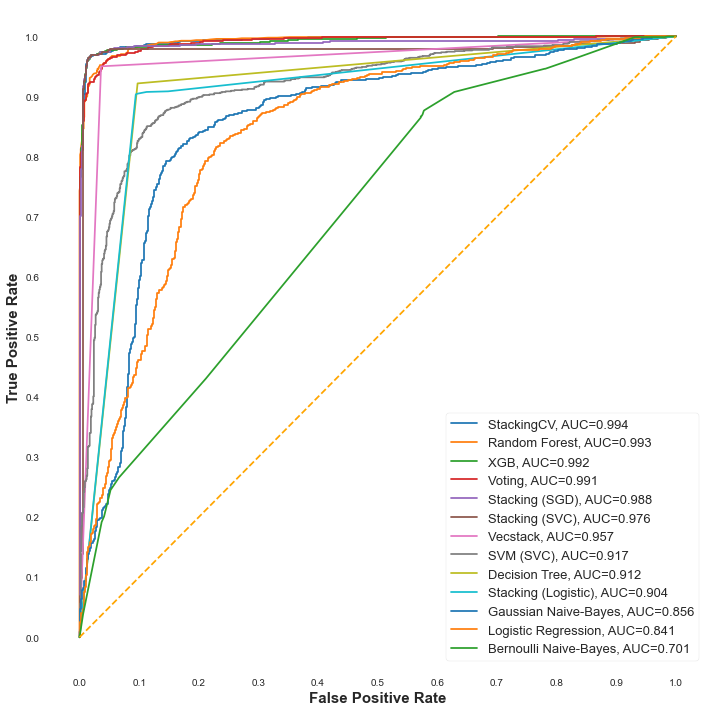

In [107]:
fig = plt.figure(figsize=(10,10))

for i in roc_plot_df.index:
    plt.plot(roc_plot_df.loc[i]['FPR'], 
             roc_plot_df.loc[i]['TPR'], 
             label="{}, AUC={:.3f}".format(i, roc_plot_df.loc[i]['AUC']))
    
plt.plot([0,1], [0,1], color='orange', linestyle='--')
plt.rcParams.update({'figure.autolayout': True})

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("False Positive Rate", fontsize=15, fontweight="bold")

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15, fontweight="bold")

#plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')
plt.savefig('ROC_Curve_Analysis.png')

plt.show()

In [108]:
results_df_temp.reset_index(inplace=True)
df_results_temp_scatter = results_df_temp[(results_df_temp['Recall']>0.95) & (results_df_temp['Precision']>0.95)]
df_results_temp_scatter = df_results_temp_scatter.loc[:, ['Classifier','Precision', 'Recall']].sort_values(by='Precision')

In [109]:
df_results_temp_scatter

,Classifier,Precision,Recall
10,Vecstack,0.962963,0.950254
12,XGB,0.983385,0.961421
7,Stacking (SGD),0.983437,0.964467
8,Stacking (SVC),0.984391,0.960406
9,StackingCV,0.984440,0.963452


In [110]:
precision = df_results_temp_scatter['Precision'].to_list
recall = df_results_temp_scatter['Recall'].to_list
classifier = df_results_temp_scatter['Classifier'].to_list

<Figure size 576x396 with 0 Axes>

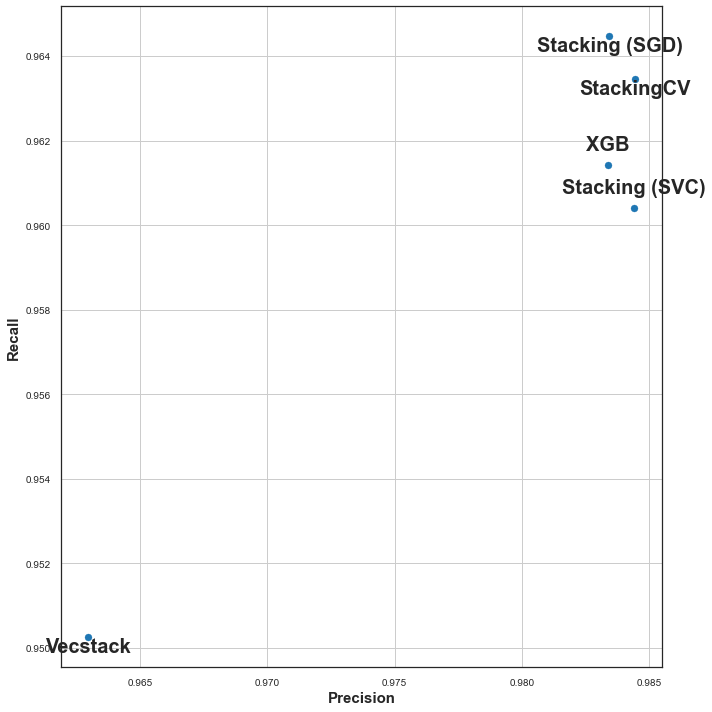

In [111]:
plt.clf()
plt.rcParams.update({'figure.autolayout': True})
plt.figure(figsize=(10,10))
plt.rcParams["axes.edgecolor"] = "0.15"
plt.rcParams["axes.linewidth"]  = 1.25
plt.scatter(df_results_temp_scatter.Precision, df_results_temp_scatter.Recall)
plt.grid()
temp = -1
temp_1 = -1
for x,y,z in zip(df_results_temp_scatter.Precision, df_results_temp_scatter.Recall, df_results_temp_scatter.Classifier):
    temp_1 = temp_1*temp

    plt.annotate(z, # this is the text
                 (x,y), # this is the point to label
                 textcoords="offset points", # how to position the text
                 xytext=(0,-15*temp_1), # distance from text to points (x,y)
                 fontweight="bold", 
                 fontsize = 20, 
                 ha='center') # horizontal alignment can be left, right or center

#plt.title("Precision vs. Recall", fontsize = 15, fontweight="bold")
plt.xlabel("Precision", fontsize=15, fontweight="bold")
plt.ylabel("Recall", fontsize=15, fontweight="bold")
plt.savefig('Precision_vs_Recall.png')
plt.show()

In [112]:
results_df_final = results_df_temp.iloc[:, [0,1,3,2,4,5,8,9,10,11,12]].sort_values(by='AUC', ascending=False)

In [113]:
results_df_final

,Classifier,Features,Parameters,Accuracy,Recall,Precision,AUC,True_Positives,True_Negatives,False_Positives,False_Negatives
9,StackingCV,Reduced,Best,0.974255,0.963452,0.984440,0.993744,949,981,15,36
4,Random Forest,Reduced,Best,0.958102,0.946193,0.968815,0.992593,932,966,30,53
12,XGB,Reduced,Best,0.972741,0.961421,0.983385,0.992389,947,980,16,38
11,Voting,Reduced,Best,0.954064,0.945178,0.961777,0.991237,931,959,37,54
7,Stacking (SGD),Reduced,Best,0.974255,0.964467,0.983437,0.988000,950,980,16,35
8,Stacking (SVC),Reduced,Best,0.972741,0.960406,0.984391,0.976028,946,981,15,39
10,Vecstack,Reduced,Best,0.957092,0.950254,0.962963,0.957055,936,960,36,49
5,SVM (SVC),Full,Default,0.864210,0.881218,0.850980,0.916727,868,844,152,117
1,Decision Tree,Reduced,Default,0.912166,0.921827,0.903483,0.912219,908,899,97,77
6,Stacking (Logistic),Reduced,Best,0.904089,0.904569,0.902736,0.904387,891,900,96,94


In [114]:
results_df_final.to_excel("results_final.xlsx", sheet_name='Sheet_name_1')

In [115]:
sclf = StackingCVClassifier(classifiers=[clf_DT_best, clf_RF_best, clf_XGB_Best]
                            , use_probas=True
                            , random_state= rand_state
                            , meta_classifier=LogisticRegression(random_state=rand_state))

In [117]:
label = ['Decision Tree', 'Random Forest', 'XGBoost', 'Stacking Classifier']
clf_list = [clf_DT_best, clf_RF_best, clf_XGB_Best, sclf]
    
sclf.fit(X_train, y_train)
y_pred_sclf = sclf.predict(X)

In [118]:
y_pred_proba = sclf.predict_proba(X)[:, 1]

y_pred_proba

array([0.0163219 , 0.01517594, 0.01600026, ..., 0.01696123, 0.01466133,
       0.01631797])

In [119]:
y_pred_proba.shape

(4617,)

In [120]:
telecom_churn_data_final=pd.read_sql_query("SELECT * FROM telecom_churn_data ",conn)

In [121]:
telecom_churn_data_final['Risk_Score'] = y_pred_proba.tolist()

In [122]:
telecom_churn_data_final['Churn_Flag'] = y_pred_sclf.tolist()

In [123]:
telecom_churn_data_final

,columns1,columns2,columns3,columns4,columns5,columns6,columns7,columns8,columns9,columns10,...,columns14,columns15,columns16,columns17,columns18,columns19,columns20,columns21,Risk_Score,Churn_Flag
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,244.7,91,11.01,10,3,2.7,1,False.,0.016322,0.0
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,254.4,103,11.45,13.7,3,3.7,1,False.,0.015176,0.0
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,162.6,104,7.32,12.2,5,3.29,0,False.,0.016000,0.0
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,196.9,89,8.86,6.6,7,1.78,2,False.,0.032552,0.0
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,186.9,121,8.41,10.1,3,2.73,3,False.,0.027373,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,...,158.6,122,7.14,8.5,6,2.3,3,False.,0.015166,0.0
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,...,163.6,116,7.36,15.7,1,4.24,3,False.,0.016189,0.0
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,200.9,91,9.04,13,3,3.51,1,False.,0.016961,0.0
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,165.5,96,7.45,14.3,3,3.86,0,False.,0.014661,0.0
